**Part 1: Data Cleaning, EDA and Feature Engineering**  

1. Train Data Cleaning, EDA and Feature Engineering
2. Weather Data Cleaning, EDA and Feature Engineering
3. **Spray Data Cleaning, EDA and Feature Engineering**
4. Combined EDA and Feature Engineering, Pre-Processing

Part 2: Modeling  

  5. Modelling, Iteration, Limitations, CBA, Recommendations & Conclusion

## Table of Contents
1. [Problem Statement](#1.-Problem-Statement)  
2. [Module Imports](#2.-Module-Imports)   
3. [Function Definitions](#3.-Function-Definitions)  
4. [Read CSVs](#4.-Read-CSVs)
5. [Data Cleaning](#5.-Data-Cleaning)
6. [EDA](#6.-EDA)
7. [Exporting to csv](#7.-Exporting-to-csv)

## 1. Problem Statement
[Return to top](#Table-of-Contents)

- Introduction  
West Nile virus is most commonly spread to humans through infected mosquitos. Around 20% of people who become infected with the virus develop symptoms ranging from a persistent fever, to serious neurological illnesses that can result in death.
In 2002, the first human cases of West Nile virus were reported in Chicago. By 2004 the City of Chicago and the Chicago Department of Public Health (CDPH) had established a comprehensive surveillance and control program that is still in effect today. Every week from late spring through the fall, mosquitos in traps across the city are tested for the virus. The results of these tests influence when and where the city will spray airborne pesticides to control adult mosquito populations.  


- Problem Statement  
Given weather, location, testing, and spraying data, this competition asks you to predict when and where different species of mosquitos will test positive for West Nile virus. A more accurate method of predicting outbreaks of West Nile virus in mosquitos will help the City of Chicago and CPHD more efficiently and effectively allocate resources towards preventing transmission of this potentially deadly virus.  


- Stakeholders:
    - Primary stakeholders: City of Chicago and the Chicago Department of Public Health (CDPH)  
    - Secondary stakeholders: General public for awareness

## 2. Module Imports
[Return to top](#Table-of-Contents)

In [1]:
# Standard imports
import numpy as np # Version 1.20.1
import pandas as pd # Version 1.2.4
# Pandas settings
pd.set_option('display.max_rows', None)
pd.set_option("display.max_columns", None)

# Time Series imports
import datetime as dt # Version 2.8.1

# Plotting imports
import seaborn as sns # Version 0.11.1
import matplotlib.pyplot as plt # Version 3.3.4
import folium # 0.12.1.post1
from branca.element import Figure # 0.4.2

# Please reduce "DPI" values below if plots take too long to display 
# Higher values make plots remain clear when zoomed in
plt.rcParams['figure.dpi'] = 200
# The lowest recommended value is 200 for A4 size print legibility 
# The recommended value is 600 for 'photograph-like' legibility
plt.style.use('ggplot')

## 3. Function Definitions
[Return to top](#Table-of-Contents)

In [2]:
# Find number of days between two dates
def numofdays(date1, date2):
    return (date2-date1).days

## 4. Read CSVs
[Return to top](#Table-of-Contents)

In [3]:
spray = pd.read_csv('../data/spray.csv', parse_dates = ['Date'])
train = pd.read_csv('../data/train.csv', parse_dates = ['Date'])

In [4]:
spray.shape

(14835, 4)

In [5]:
spray.columns

Index(['Date', 'Time', 'Latitude', 'Longitude'], dtype='object')

## 5. Data Cleaning
[Return to top](#Table-of-Contents)

In [6]:
# Checking for duplicated rows
spray.duplicated().sum()

541

In [7]:
# Drop duplicated rows
spray.drop_duplicates(inplace=True)

In [8]:
# Display the first 5 rows of the dataframe
spray.head(5)
# click ... below to see output

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [9]:
# Info shows us the datatypes for each columns, presence of null values as well as the column names
spray.info()
# click ... below to see output

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14294 entries, 0 to 14834
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       14294 non-null  datetime64[ns]
 1   Time       13710 non-null  object        
 2   Latitude   14294 non-null  float64       
 3   Longitude  14294 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 558.4+ KB


In [10]:
# Splitting date into year and month columns
spray['Year'] = spray['Date'].dt.year
train['Year'] = train['Date'].dt.year
spray['Month'] = spray['Date'].dt.month
train['Month'] = train['Date'].dt.month
spray['Week_of_year'] = spray['Date'].dt.isocalendar().week
spray['Day_of_Week'] = spray['Date'].dt.dayofweek
train['Week_of_year'] = train['Date'].dt.isocalendar().week
train['Day_of_Week'] = train['Date'].dt.dayofweek

In [11]:
spray.isnull().sum()
# click ... below to see output

Date              0
Time            584
Latitude          0
Longitude         0
Year              0
Month             0
Week_of_year      0
Day_of_Week       0
dtype: int64

In [12]:
spray.drop(columns = ['Time'], inplace = True)

## 6. EDA
[Return to top](#Table-of-Contents)

In [13]:
# Showing unique values for all columns
for col in spray.columns:
    print(f"{col}:")
    print(spray[col].unique())
    print('\n')
# Click ... below to see output

Date:
['2011-08-29T00:00:00.000000000' '2011-09-07T00:00:00.000000000'
 '2013-07-17T00:00:00.000000000' '2013-07-25T00:00:00.000000000'
 '2013-08-08T00:00:00.000000000' '2013-08-15T00:00:00.000000000'
 '2013-08-16T00:00:00.000000000' '2013-08-22T00:00:00.000000000'
 '2013-08-29T00:00:00.000000000' '2013-09-05T00:00:00.000000000']


Latitude:
[42.39162333 42.39134833 42.39102167 ... 42.00602167 42.00545333
 42.004805  ]


Longitude:
[-88.08916333 -88.08915667 -88.08915833 ... -87.81739167 -87.81742333
 -87.81746   ]


Year:
[2011 2013]


Month:
[8 9 7]


Week_of_year:
<IntegerArray>
[35, 36, 29, 30, 32, 33, 34]
Length: 7, dtype: UInt32


Day_of_Week:
[0 2 3 4]




**Observations**  
- Our spray dataset has only provided us with data for the years **2011** and **2013** for the months of **July**, **August** and **September**.

- Interestingly, sprays only occur on **Sundays, Tuesdays, Wednesdays, and Thursdays**.

- We will want to contrast this against our train dataset in the same months for years which are **not 2011** and **2013** to get a general sense of the impact of spray on our dependent variable (WNVPresent) as well as on the mosquito population (NumMosquitos).

- We will proceed by first identifying the start and end dates for spraying in each of the years.

**Number of sprays conducted each year**

In [14]:
chicago = [41.881832, -87.623177] # Chicaco Coord
spray2011_loc = spray[spray['Year'] == 2011][['Latitude','Longitude']]
spray2011_loc_list = spray2011_loc.values.tolist()
spray2011_loc_list_size = len(spray2011_loc_list)

spray2013_loc = spray[spray['Year'] == 2013][['Latitude','Longitude']]
spray2013_loc_list = spray2013_loc.values.tolist()
spray2013_loc_list_size = len(spray2013_loc_list)

2011     1668
2013    12626
Name: Year, dtype: int64

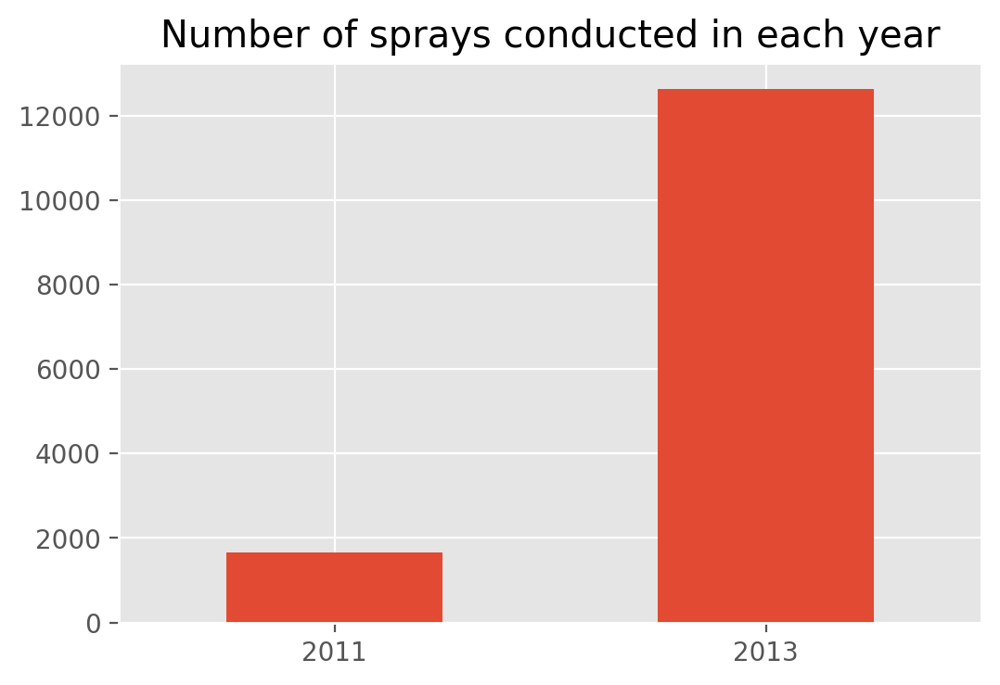

In [15]:
# Plot for number of sprays conducted in each year (2011,2013)
numspray = spray['Year'].value_counts(ascending = True)
numspray.plot(kind = 'bar' , title = 'Number of sprays conducted in each year')
plt.xticks(rotation = 0);
numspray

In [16]:
# Plotting spray locations for 2011,2013
map_obj = folium.Map(location = chicago, width = '100%', height = '100%', zoom_start = 9, tiles= 'CartoDB dark_matter')
for year, group in spray.groupby('Year'):
    feature_group = folium.FeatureGroup(year)
    for row in group.itertuples():
        if row.Year == 2011:
            folium.CircleMarker(location = [row.Latitude, row.Longitude], radius = 1, color = 'orange',tooltip = row.Date).add_to(feature_group)
        else:
            folium.CircleMarker(location = [row.Latitude, row.Longitude], radius = 1, color = 'lightblue',tooltip =row.Date).add_to(feature_group)
    feature_group.add_to(map_obj)

folium.LayerControl().add_to(map_obj) 
# Refer to top right hand of Map visualizations for toggling of traps for each year
map_obj

In [17]:
pct_change =  12626/1668 * 100
pct_change

756.9544364508392

**Observations**  
- We can see that of all spraying conducted, there significantly higher spraying efforts in 2013 as compared to 2011, with over **756%** increase in the number of sprays.

- Using the map visualization, we managed to identify the areas covered in each of the years from the lat. lon. values:
    - **2011**: Left and right neighbourhoods along N Cedar Lake Road and 3-4 neighbourhoods North of Hardwood Heights
    
    - **2013**: Saw a vast improvement in terms of area targeted for sprays


**Number unique locations sprayed conducted each year**

Year
2011     1249
2013    11672
Name: Latitude, dtype: int64

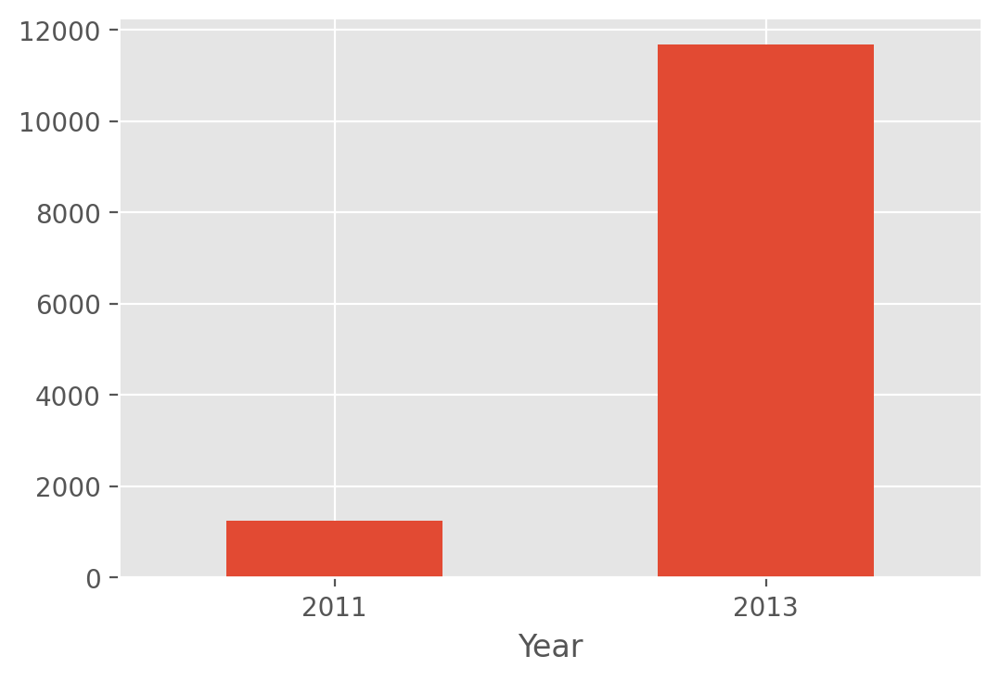

In [18]:
# Plot for number of unique locations conducted in each year (2011,2013)
uniquelocsprayed = spray.groupby(by = 'Year')['Latitude'].nunique()
uniquelocsprayed.sort_values(ascending = False)
uniquelocsprayed.plot(kind = 'bar')
plt.xticks(rotation = 0);
uniquelocsprayed

In [19]:
pct_change =  11672/1249 * 100
pct_change

934.5076060848679

**Observations**  
- The number of different unique locations sprayed has also significantly increased of over **934%** from 2011 to 2013.


**Duration of Spray windows**

In [20]:
# Finding number of days in spray window for each year
spraydur2011 = numofdays(pd.to_datetime('2011-08-29'),pd.to_datetime('2011-09-07'))
spraydur2013 = numofdays(pd.to_datetime('2013-07-17'),pd.to_datetime('2013-09-05'))

In [21]:
spraydur2011, spraydur2013

(9, 50)

**Observations**  
- Not only does 2013 have more sprays compared to 2011, the length of duration by which sprays were occurring were also significantly longer (555% increase) in 2013 over 2011.

- In order to more accurately encapsulate the relationship between spray duration and number of sprays, we calculated spray/day as the number of sprays and duration which spraying last may differ across years.

In [22]:
# Calculating spray/day for with years
sprayperday2011 = (spray[spray['Year'] == 2011].shape[0]) / spraydur2011
sprayperday2013 = (spray[spray['Year'] == 2013].shape[0]) / spraydur2013

In [23]:
print(f'2011: {round(sprayperday2011,0)} sprays per day')
print(f'2013: {round(sprayperday2013,0)} sprays per day')

2011: 185.0 sprays per day
2013: 253.0 sprays per day


Naturally, the spray/day for 2013 is also higher than 2011.

**The relationship between WNV presence and Mosquito populations**

In [24]:
spray1stday2011 = spray[spray['Year'] == 2011]['Date'][:1]
spraylastday2011 = spray[spray['Year'] == 2011]['Date'][-1:]
spray1stday2013 = spray[spray['Year'] == 2013]['Date'][:1]
spraylastday2013 = spray[spray['Year'] == 2013]['Date'][-1:]

In [25]:
# Listing start end dates for both 2011 - 2013
print(spray1stday2011)
print(spraylastday2011)
print(spray1stday2013) 
print(spraylastday2013)
# Click ... to see output below

0   2011-08-29
Name: Date, dtype: datetime64[ns]
2208   2011-09-07
Name: Date, dtype: datetime64[ns]
2209   2013-07-17
Name: Date, dtype: datetime64[ns]
14834   2013-09-05
Name: Date, dtype: datetime64[ns]


In [26]:
# Declaring varaibles to prepare for plotting
wnv_2011 = train[train['Date'].dt.year==2011].groupby('Date')['WnvPresent'].sum()
wnv_2013 = train[train['Date'].dt.year==2013].groupby('Date')['WnvPresent'].sum()
mosquitos_2011 = train[train['Date'].dt.year==2011].groupby('Date')['NumMosquitos'].sum()
mosquitos_2013 = train[train['Date'].dt.year==2013].groupby('Date')['NumMosquitos'].sum()

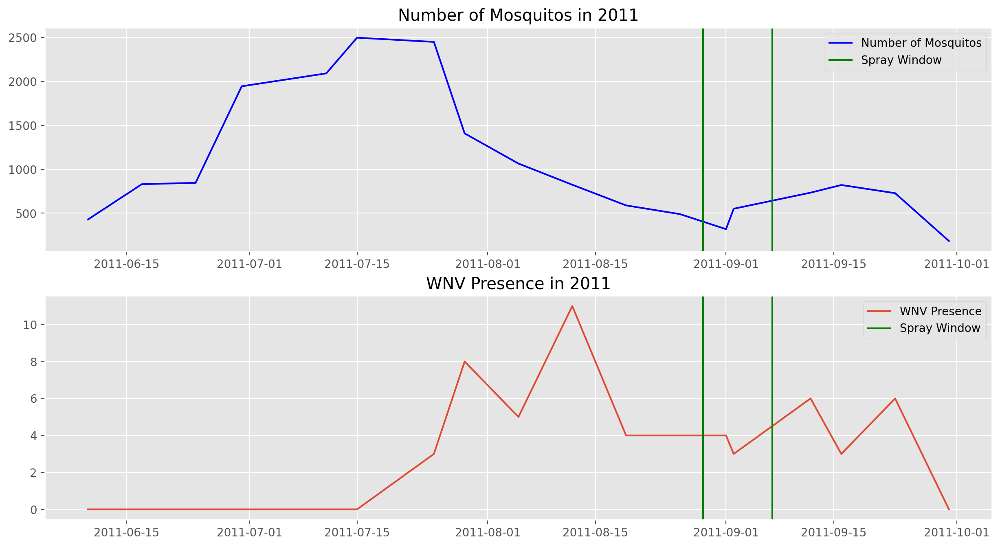

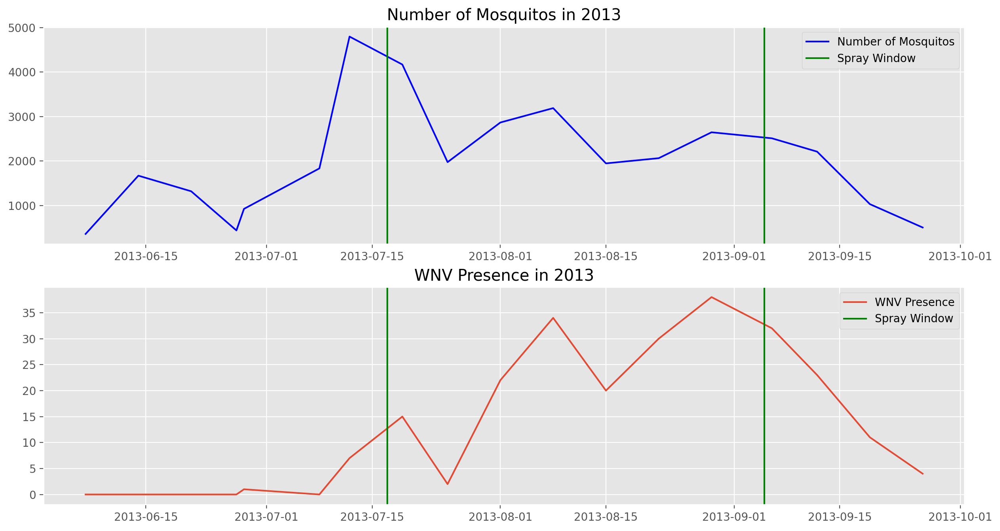

In [27]:
# Visualiations for Number of Mosquitos and WNV Presence in a given year, with Spray windows in given year indicated
# Visualizations for year 2011
fig, axes = plt.subplots(nrows=2, figsize=(15,8))
axes[0].plot(mosquitos_2011.index,mosquitos_2011.values,color='blue')
axes[0].axvline(x=spray1stday2011, color='Green', ls='-')
axes[0].axvline(x=spraylastday2011, color='Green', ls='-')
axes[0].set_title('Number of Mosquitos in 2011')
axes[0].legend(['Number of Mosquitos','Spray Window']);
axes[1].plot(wnv_2011.index,wnv_2011.values)
axes[1].axvline(x=spray1stday2011, color='Green', ls='-')
axes[1].axvline(x=spraylastday2011, color='Green', ls='-')
axes[1].set_title('WNV Presence in 2011')
axes[1].legend(['WNV Presence','Spray Window']);

# Visualizations for year 2013
fig, axes = plt.subplots(nrows=2, figsize=(15,8))
axes[0].plot(mosquitos_2013.index,mosquitos_2013.values,color='blue')
axes[0].axvline(x=spray1stday2013, color='Green', ls='-')
axes[0].axvline(x=spraylastday2013, color='Green', ls='-')
axes[0].set_title('Number of Mosquitos in 2013')
axes[0].legend(['Number of Mosquitos','Spray Window']);
axes[1].plot(wnv_2013.index,wnv_2013.values)
axes[1].axvline(x=spray1stday2013, color='Green', ls='-')
axes[1].axvline(x=spraylastday2013, color='Green', ls='-')
axes[1].set_title('WNV Presence in 2013')
axes[1].legend(['WNV Presence','Spray Window']);

**Observations**  
With the above visualizations, we can see the impact of spraying on the mosquito population and WNV presence.

- In **2011** it was done over a period of **9 days**, in **1249 unique locations** and **1668 times**  
- In **2013** it was done over a period of **50 days**, in **11672 unique locations** and **12626 times**

While its effect in 2011 might not be significant and largely noticeable, we were still able to observe a *decrease in both mosquito population and WNV presence from the beginning of the spray window up till the end of August*.

In 2013, spraying had a much stronger impact where we saw 3 sharp decreases in the same timeframe for  both WNV presence and the mosquito population:

- **First**: *in the second week to third week of July*
- **Second**: *in the first week to second week of August*
- **Third**: *in the last week of August to the first week of September*

According to the [department of public health in Illinois](https://dph.illinois.gov/topics-services/environmental-health-protection/structural-pest-control/mosquito-spray-faqs.html), flying mosquitoes within the treated area are killed. Fogging will kill only part of the mosquitoes in a given area for a few days. Although the local mosquito population is reduced for a few days, fogging does not prevent mosquitoes from re-entering the area. This corresponds to what we see on our 2013 graph above, where we observe a reduction in the mosquito population for a few days before seeing it increase again.

## 7. Exporting to csv
[Return to top](#Table-of-Contents)

In [28]:
spray.to_csv('../data/spray_cleaned.csv', index = False)